# Practical Session : Mathematical Morphology and Histogram manipulations

The aim of this practical work is to get acquainted with mathematical morphology
transformations. Applying different operations with several structuring elements on
simple images will allow you understanding the actions, effects and properties of the
operations, the role of the structuring element, as well as the need for appropriate
pre-processing depending on the application at hand.

In this session, we will mainly focus on functions from the skimage.morphology package.

First, you have to download a set of images that you will use throughout the TP: https://partage.imt.fr/index.php/s/9YPTAzKsiXHQWH3

In [1]:
## imports
import matplotlib.pyplot as plt
import skimage.io as skio
import skimage
import numpy as np
import skimage.morphology as morpho
import skimage.segmentation as seg
student = True

## Mathematical morphology

### The structuring element
The basic idea in mathematical orphology is to probe an image with a simple, pre-defined shape, drawing conclusions on how this shape fits or misses the shapes in the image. This simple "probe" is called the structuring element. For example, it can take the shape of a square, a disk or a diamond, with a predefined radius.

Use the function morpho.disk() of the morpho library to visualize a disk structuring element of radius 5. 

[[0 0 0 0 0 1 0 0 0 0 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [1 1 1 1 1 1 1 1 1 1 1]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 1 1 1 1 1 1 1 1 1 0]
 [0 0 1 1 1 1 1 1 1 0 0]
 [0 0 0 0 0 1 0 0 0 0 0]]


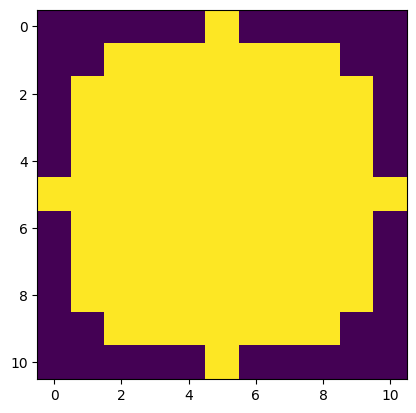

In [2]:
if student :
  strell = morpho.disk(5)

print(strell)
plt.imshow(strell)
plt.show()

Find a way to create a vertical line as a structuring element with parameter length l :

[[1]
 [1]
 [1]
 [1]
 [1]]


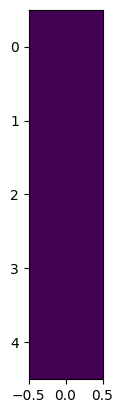

In [3]:
def line_strell(width,length):
  if student :
    strell = morpho.rectangle(width, length)
  return strell

strell = line_strell(5,1)
print(strell)
plt.imshow(strell)
plt.show()

### Binary Morphology
In this section, we will work on a cyto-image. Make sure to properly load the "cell.tif" image. Apply a thresholding of level t = 150 to that image to turn it into a binary image. Visualize the result in greyscale, by using the imshow function.

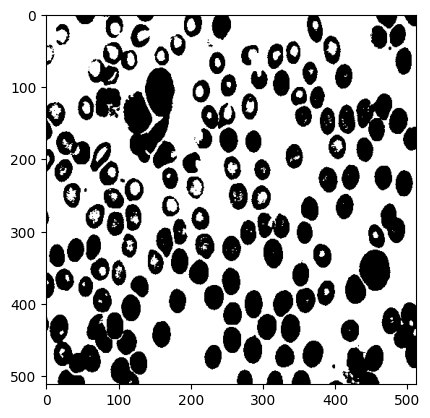

In [4]:
#load the cell image in grayscale and display it 
if student:
  img = skio.imread("images/cell.tif")
  # Theresholding and display
  img = img > 150
  plt.imshow(img, cmap = "gray")
  plt.show()

We will first start by applying simple binary morphological operations on those images. You will try the following operations:
- erosion
- dilation
- opening
- closing

You will try to visualize the results by varying the structuring element and its size.  

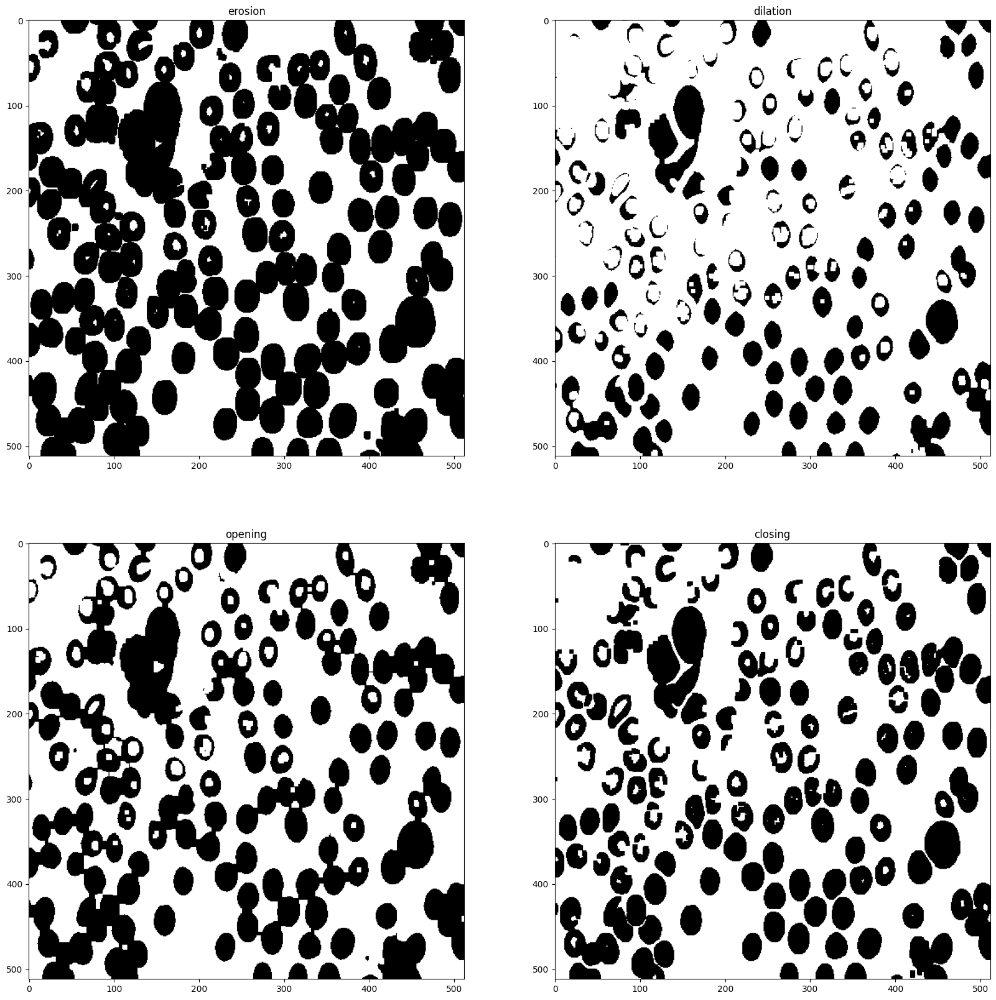

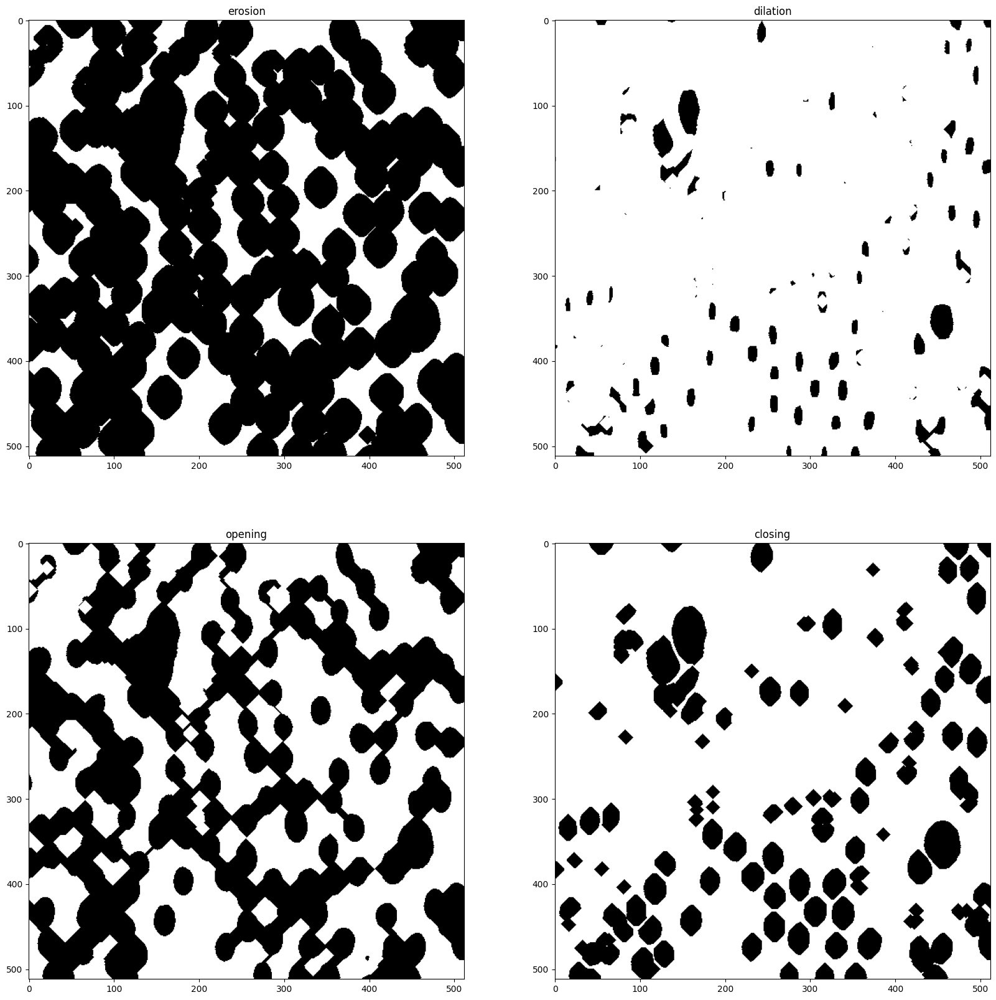

In [5]:
strell = morpho.square(5)
#strell = morpho.ellipse(5)
#strell = morpho.diamond(5)
fig,ax = plt.subplots(2, 2, figsize=(20,20))
imgs = [morpho.binary_erosion(img, strell), morpho.binary_dilation(img, strell), morpho.binary_opening(img, strell), morpho.binary_closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
names = ["erosion","dilation","opening","closing"]
for i in range(4):
  ax[i//2,i%2].set_title(names[i])
  ax[i//2,i%2].imshow(imgs[i], cmap = "gray")
plt.show()

# try your own structuring elements and make the size vary
if student :
  #strell = morpho.ellipse(5)
  strell = morpho.diamond(8)
  fig,ax = plt.subplots(2, 2, figsize=(20,20))
  imgs = [morpho.binary_erosion(img, strell), morpho.binary_dilation(img, strell), morpho.binary_opening(img, strell), morpho.binary_closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
  names = ["erosion","dilation","opening","closing"]
  for i in range(4):
    ax[i//2,i%2].set_title(names[i])
    ax[i//2,i%2].imshow(imgs[i], cmap = "gray")
  plt.show()

- **Q** : What is the influence of the shape of the structuring element ?
- **A** : The form of the structuring element has an impact on the appearance of distinct objects within the image following a morphological operation. For instance, if there's a black spot in a cell, it will resemble more of a square shape after dilation with a square structuring element than with a circular one. Plus, the shape of the structuring element tends to alter the objects in the image. The more different its shape is from that of the objects in the image, the more pronounced the distortion becomes.
- **Q** : What is the influence of the size of the structuring element ?
- **A** : If the size of the structuring element is of a similar magnitude to that of the objects to which it is applied, their shape is significantly distorted. Conversely, if the size is much smaller than that of the objects, the effects are hardly noticeable.

### Greyscale Morphology
In this section, we will use the bateau.tif image. Make sure to load it and visualize it in greyscale.


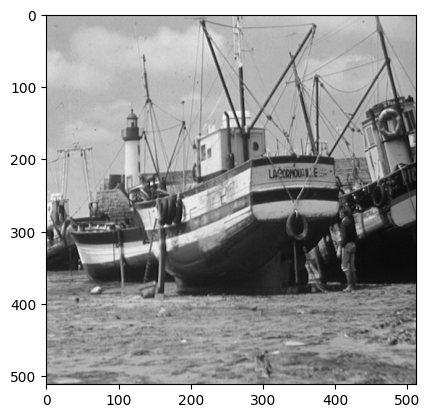

In [6]:
#load the bateau image in grayscale and display it 
if student:
  img = skio.imread("images/bateau.tif")
  plt.imshow(img, cmap = "gray")
  plt.show()

Apply the same 4 operations as before (dilation,erosion,opening,closing) and visualize the results. Try out different structuring elements and different sizes.

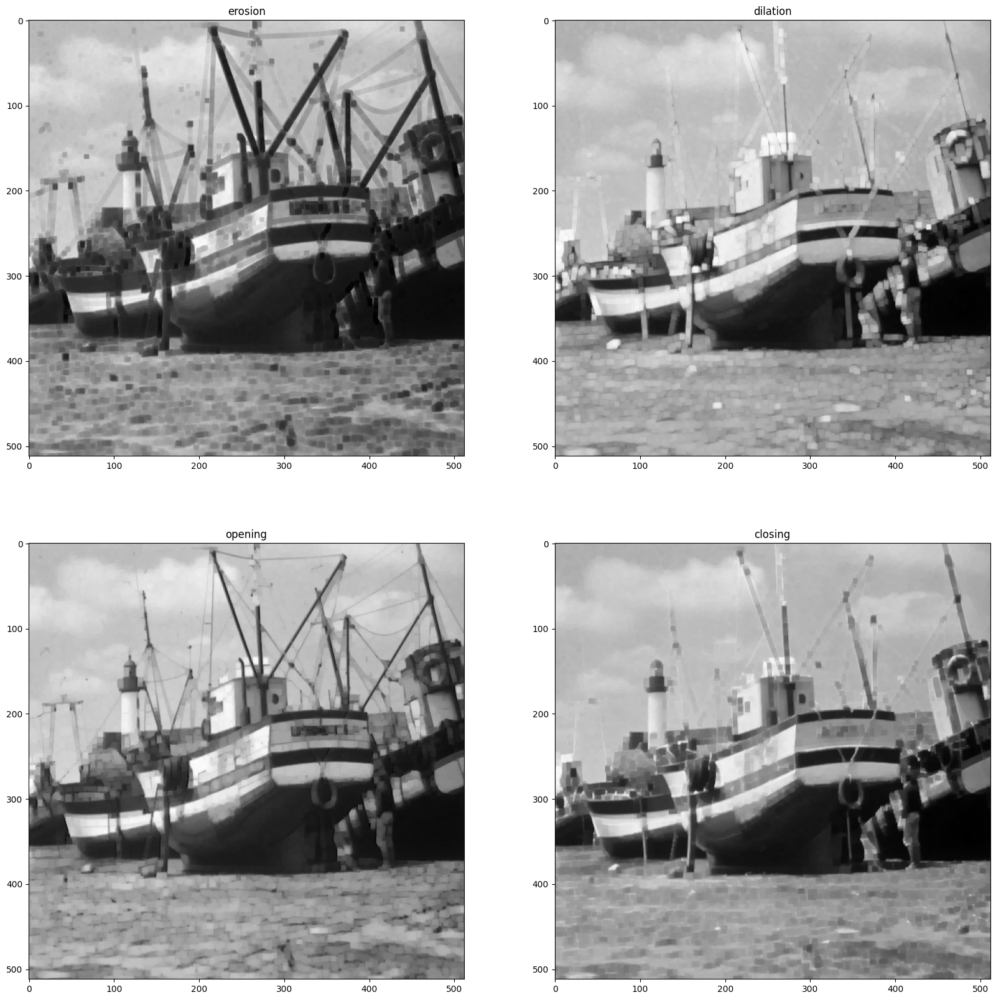

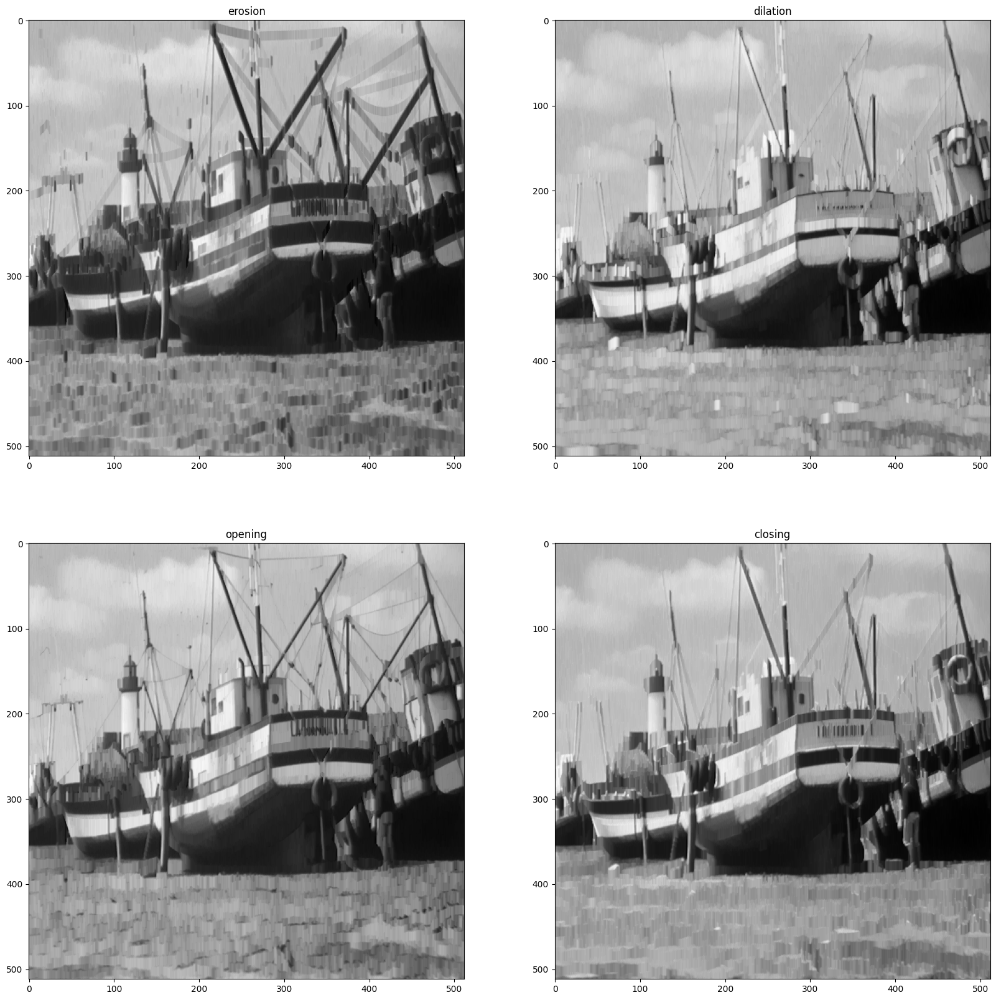

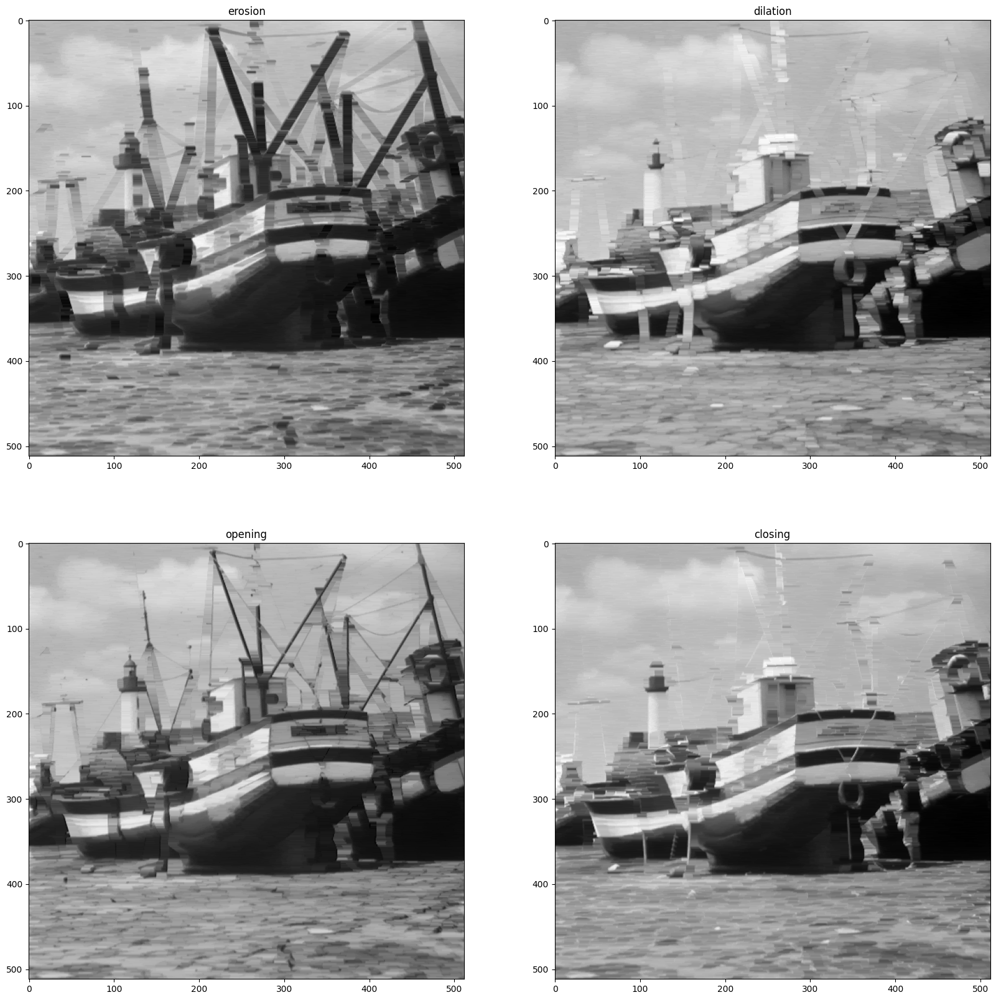

In [7]:
if student:
    img = skio.imread("images/bateau.tif")
    strell = morpho.square(5)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(img, strell),morpho.dilation(img, strell),morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

if student:
    img = skio.imread("images/bateau.tif")
    strell = line_strell(10,1)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(img, strell),morpho.dilation(img, strell),morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

if student:
    img = skio.imread("images/bateau.tif")
    strell = line_strell(1,10)
    fig,ax = plt.subplots(2, 2, figsize=(20,20))
    imgs = [morpho.erosion(img, strell),morpho.dilation(img, strell),morpho.opening(img, strell),morpho.closing(img, strell)]# Add in this list the 4 images, obtained with the for operations
    names = ["erosion","dilation","opening","closing"]
    for i in range(4):
      ax[i//2,i%2].set_title(names[i])
      ax[i//2,i%2].imshow(imgs[i],cmap = "gray")
    plt.show()

- **Q** : What is the influence of the shape and size parameters of the structuring element ?
- **A** : The larger the structuring element compared to the objects it is applied to, the more noticeable artifacts resembling the shape of the element tend to appear. For instance, when the structuring element is a line and it becomes significantly larger than all the elements in the image, vertical lines start to emerge.

- **Q** : We then now try to illustrate the iterativity property. What is the
result of a dilation by a disk structuring element of size 2 followed by a dilation by a
disk structuring element of size 3? Compare it with a dilation by a disk of size 5. Explain.
- **A** : The two images are nearly identical, with remaining residues attributed to the edges of the structural elements.

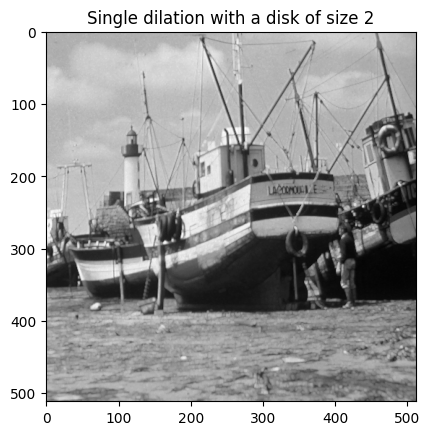

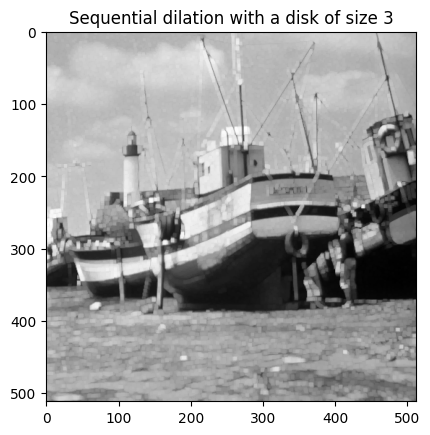

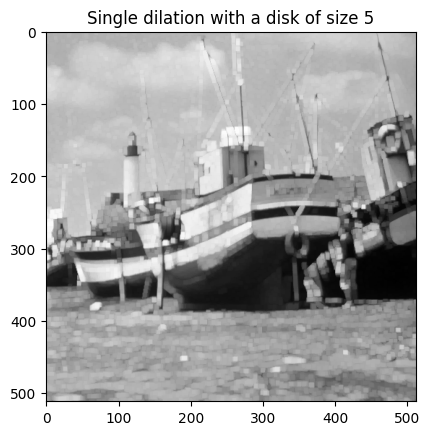

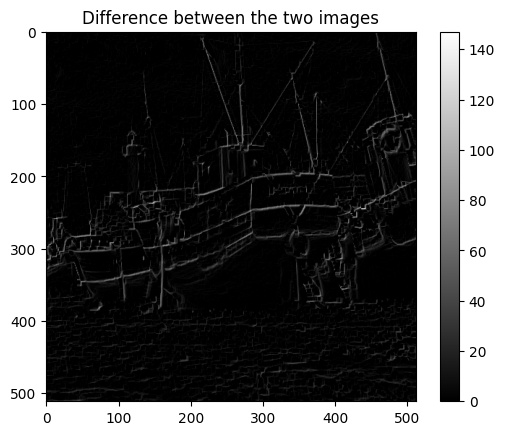

51747148


In [8]:
if student:
  ### start code
  strell2 = morpho.square(2)
  dilation = morpho.dilation(img, strell2)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation with a disk of size 2")
  plt.show()

  strell3 = morpho.square(3)
  sequential_dilation = morpho.dilation(dilation, strell3)
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential dilation with a disk of size 3")
  plt.show()

  strell4 = morpho.square(5)
  dilatation2 = morpho.dilation(img, strell4)
  plt.imshow(dilatation2,cmap = "gray")
  plt.title("Single dilation with a disk of size 5")
  plt.show()

  plt.imshow(dilatation2-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** Plot the result of an opening by a disk structuring element of size 2 followed by
an opening by a disk structuring element of size 3? 
Compare with a dilation of the image by (a disk of size 2 dilated by a disk of size 3). Please note that you might have to use the np.pad function to perform this. Conclude.
- **A:** The two images are not very identical. Which means that the results of opening by a disk structuring element of size 2 followed by an opening by a disk structuring element of size 3 are not equivalent to a dilation of the image by a disk of size 2 dilated by a disk of size 3. 

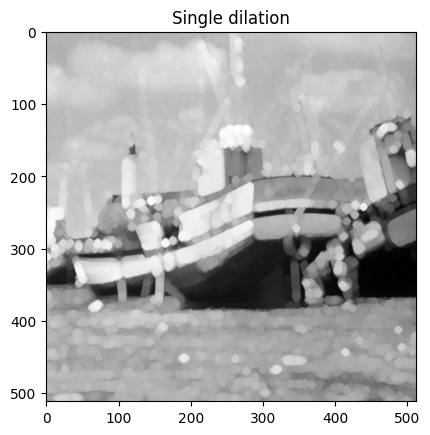

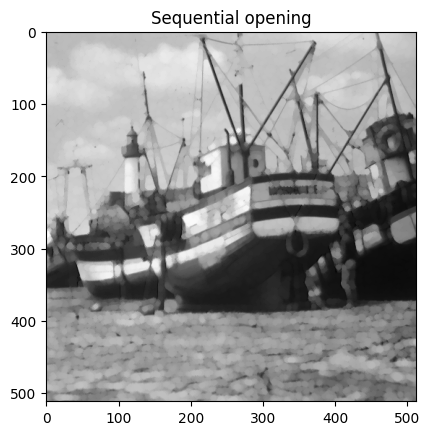

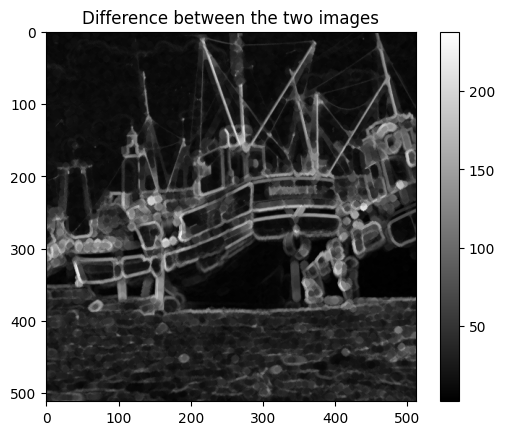

10548416


In [9]:
if student:
 # First create the sequential structuring element, that is a disk of size 2 dilated by a disk of size 3

  # Create a disk of size 2
  disk_size_2 = morpho.disk(2)

    # Create a disk of size 3
  disk_size_3 = morpho.disk(3)

    # Calculate the padding size
  pad_size = (3, 3)  # 3 pixels on all sides (2 for the size of the disk and 1 for dilation)

    # Pad the disk of size 2
  padded_disk_size_2 = np.pad(disk_size_2, pad_size)

    # Dilate the padded disk with the disk of size 3
  sequential_strell = morpho.dilation(padded_disk_size_2, disk_size_3)

  # Use it to perform the image dilation
  dilation = morpho.dilation(img, sequential_strell)
  plt.imshow(dilation,cmap = "gray")
  plt.title("Single dilation")
  plt.show()
  
  # Compare it with the sequential dilation
  sequential_dilation = morpho.opening(morpho.opening(img, morpho.disk(2)), morpho.disk(3))
  plt.imshow(sequential_dilation,cmap = "gray")
  plt.title("Sequential opening")
  plt.show()

  plt.imshow(dilation-sequential_dilation,cmap = "gray")
  plt.title('Difference between the two images')
  plt.colorbar()
  plt.show()
  print(np.sum(np.abs(dilation-sequential_dilation)))

- **Q:** How can you illustrate the idempotence of closing ? Show your illustration in the following cell.


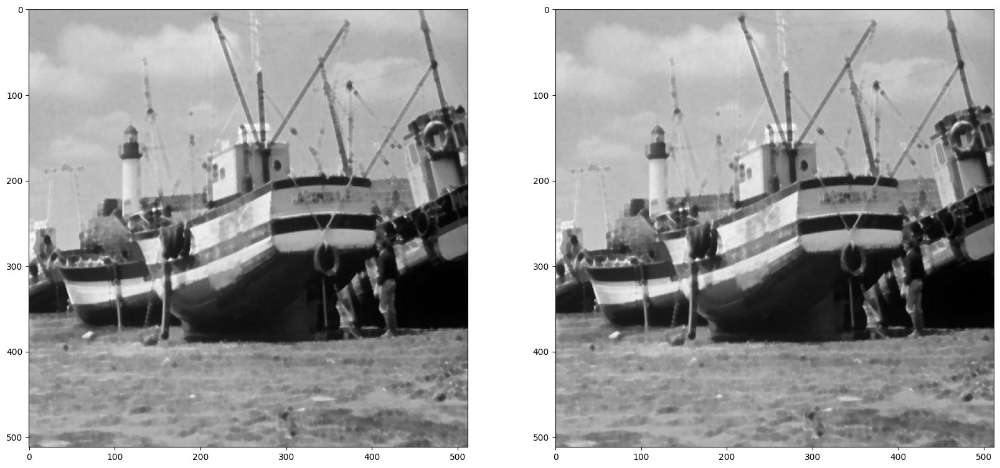

In [10]:
if student :
    img = skio.imread("images/bateau.tif")
    strell = morpho.disk(2)
    fig,ax = plt.subplots(1, 2, figsize=(20,20))
    ax[0].imshow(morpho.closing(morpho.closing(img, strell),strell), cmap="gray")
    ax[1].imshow(morpho.closing(img, strell), cmap="gray")
plt.show()

- **Q** : Perform a top-hat transform in the following cell (difference between the image and its opening).
Comment the result depending on the choice of the structuring element.
- **A** : The top-hat operation isolates smaller bright areas in the image compared to the size of the structuring element. The size of the structuring element impacts the dimensions of the features extracted from the image, while the shape of the structuring element influences the shape of these extracted features.

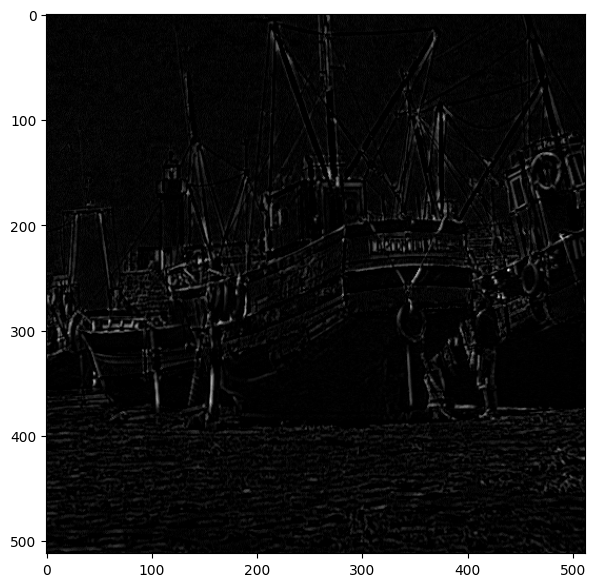

In [11]:
if student:
  ### start code
  strell = morpho.disk(2)
  top_hat = img - morpho.opening(img, strell)
plt.figure(figsize = (7,7))
plt.imshow(top_hat,cmap = "gray")
plt.show()

- **Q** : Perform a dual top-hat transform in the following cell (difference between the closing and the image).
Comment the result depending on the choice of the structuring element.
- **A** : The dual top-hat operation highlights smaller dark regions in the image relative to the size of the structuring element. The size of the structuring element determines the dimensions of the features extracted from the image, while the shape of the structuring element influences the shape of these extracted features.

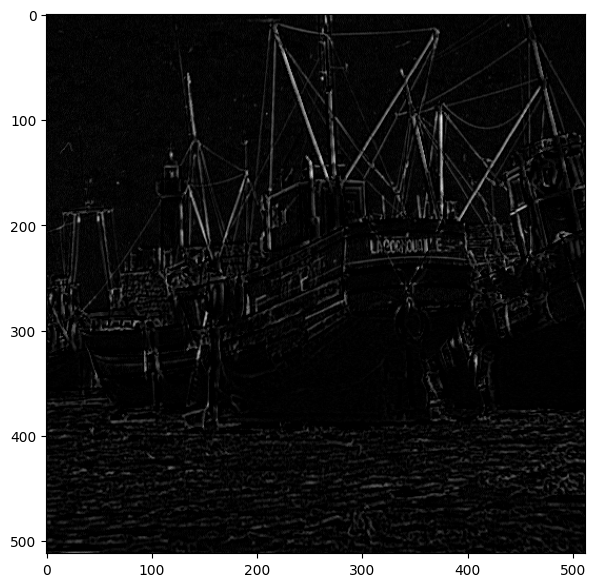

In [12]:
if student:
  ### start code
  strell = morpho.disk(2)
  dual_top_hat = morpho.closing(img, strell) - img
plt.figure(figsize = (7,7))
plt.imshow(dual_top_hat,cmap = "gray")
plt.show()

### Alternating Filters
- **Q**: Perform alternate sequential filters, for instance by performing sequential opening and then closing by squares of radius ranging from 1 to 5. Also try out your own combinations. What kind of filtering can be expected from such
operations?
- **A**: Utilizing alternate sequential filters appears to streamline the image, retaining the primary features' shapes while eliminating intricate textures and color variations within a single feature. These filters could prove beneficial for feature extraction purposes.

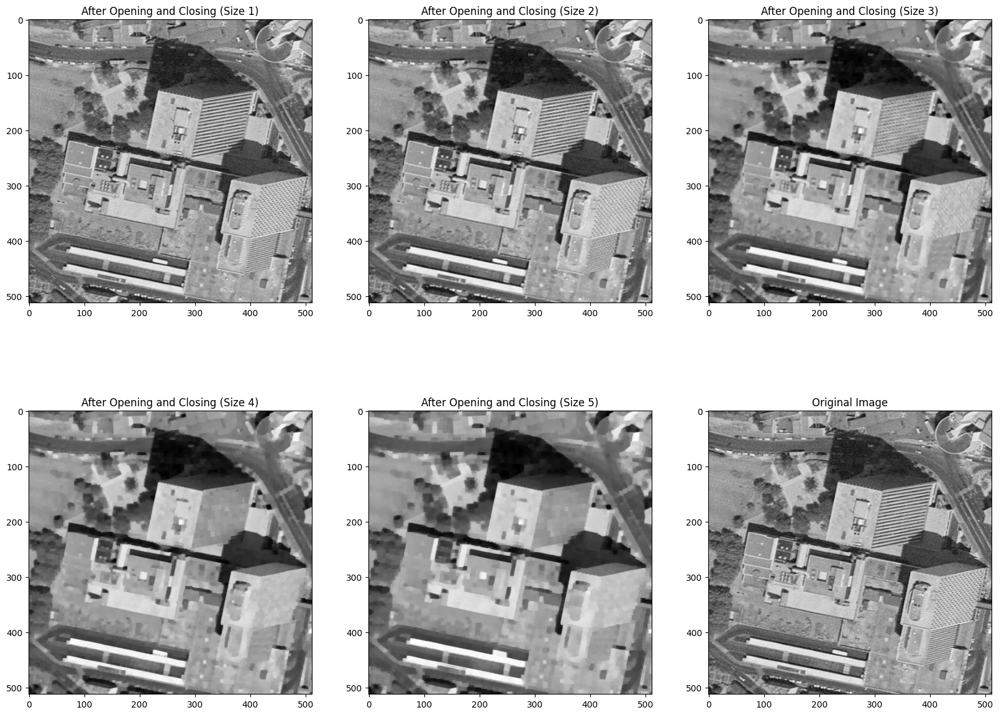

In [13]:
if student:
  img = skio.imread("images/montreuil.tif")
  se1 = morpho.square(1)
  se2 = morpho.square(2)
  se3 = morpho.square(3)
  se4 = morpho.square(4)
  se5 = morpho.square(5)
  fas1 = morpho.closing(morpho.opening(img, se1), se1)
  fas2 = morpho.closing(morpho.opening(fas1, se2), se2)
  fas3 = morpho.closing(morpho.opening(fas2, se3), se3)
  fas4 = morpho.closing(morpho.opening(fas3, se4), se4)
  fas5 = morpho.closing(morpho.opening(fas4, se5), se5)

  fig, ax = plt.subplots(2, 3, figsize=(20, 15))
  ax[0, 0].imshow(fas1, cmap="gray")
  ax[0, 1].imshow(fas2, cmap="gray")
  ax[0, 2].imshow(fas3, cmap="gray")
  ax[1, 0].imshow(fas4, cmap="gray")
  ax[1, 1].imshow(fas5, cmap="gray")
  ax[1, 2].imshow(img, cmap="gray")

  # Add meaningful titles to each subplot
  ax[0, 0].set_title("After Opening and Closing (Size 1)")
  ax[0, 1].set_title("After Opening and Closing (Size 2)")
  ax[0, 2].set_title("After Opening and Closing (Size 3)")
  ax[1, 0].set_title("After Opening and Closing (Size 4)")
  ax[1, 1].set_title("After Opening and Closing (Size 5)")
  ax[1, 2].set_title("Original Image")

  plt.show()

### Segmentation
 - **Q** : Apply a morphological gradient to the image cell.tif (difference between
dilation and erosion with a structuring element of radius1). What do you observe ?

- **A**: The morphological gradient highlights the regions in the image where the intensity change is most pronounced.

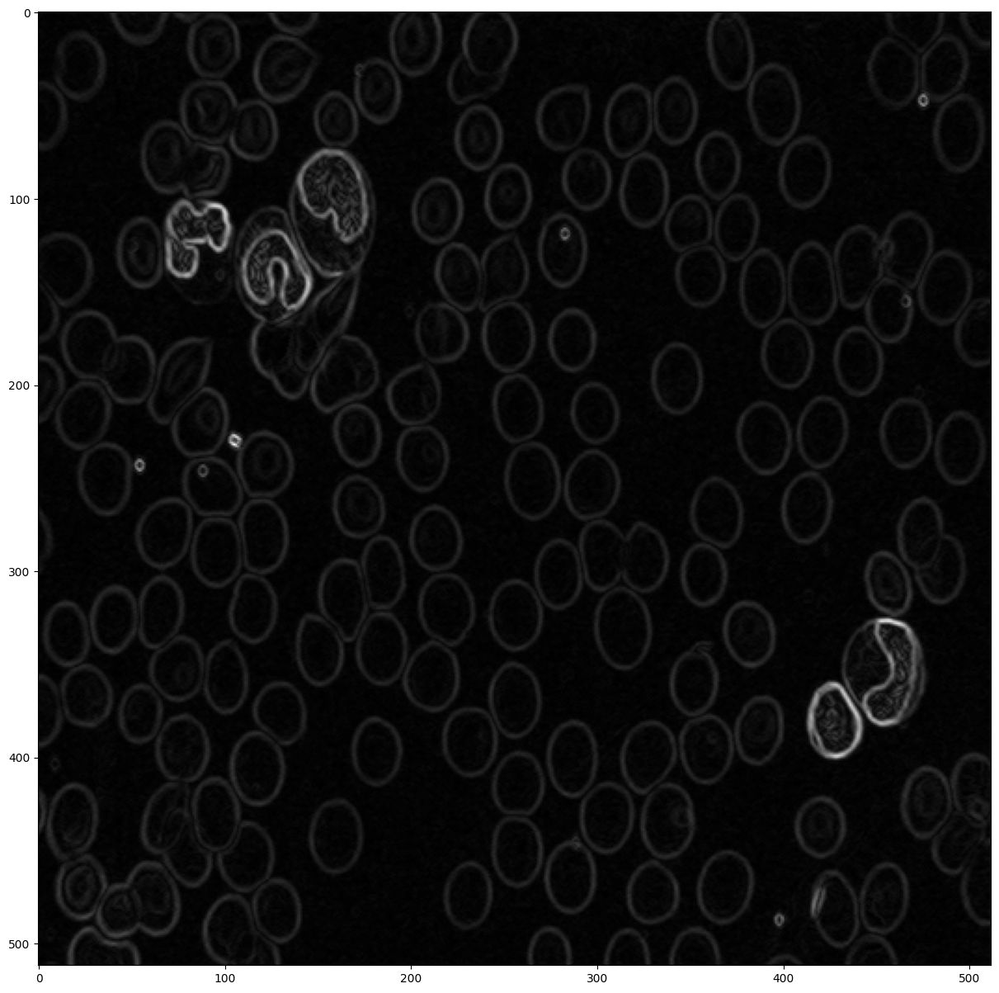

In [14]:
if student : 
  img = skio.imread("images/cell.tif")
  strell = morpho.disk(1)
  morpho_grad = morpho.dilation(img, strell) - morpho.erosion(img, strell)
plt.figure(figsize=(15,15))
plt.imshow(morpho_grad,cmap = "gray")
plt.show()

- **Q** : Try to threshold the gradient with a value of 25 for instance. Why is is difficult to find an appropriate threshold value ?
- **A** : Finding the right threshold value poses a challenge due to the need to strike a balance. When we raise the threshold, we effectively suppress unwanted parasite structures, but this action may also cause the disappearance of genuine boundaries between regions with similar grey levels. Hence, achieving equilibrium between these two aspects is a complex task.

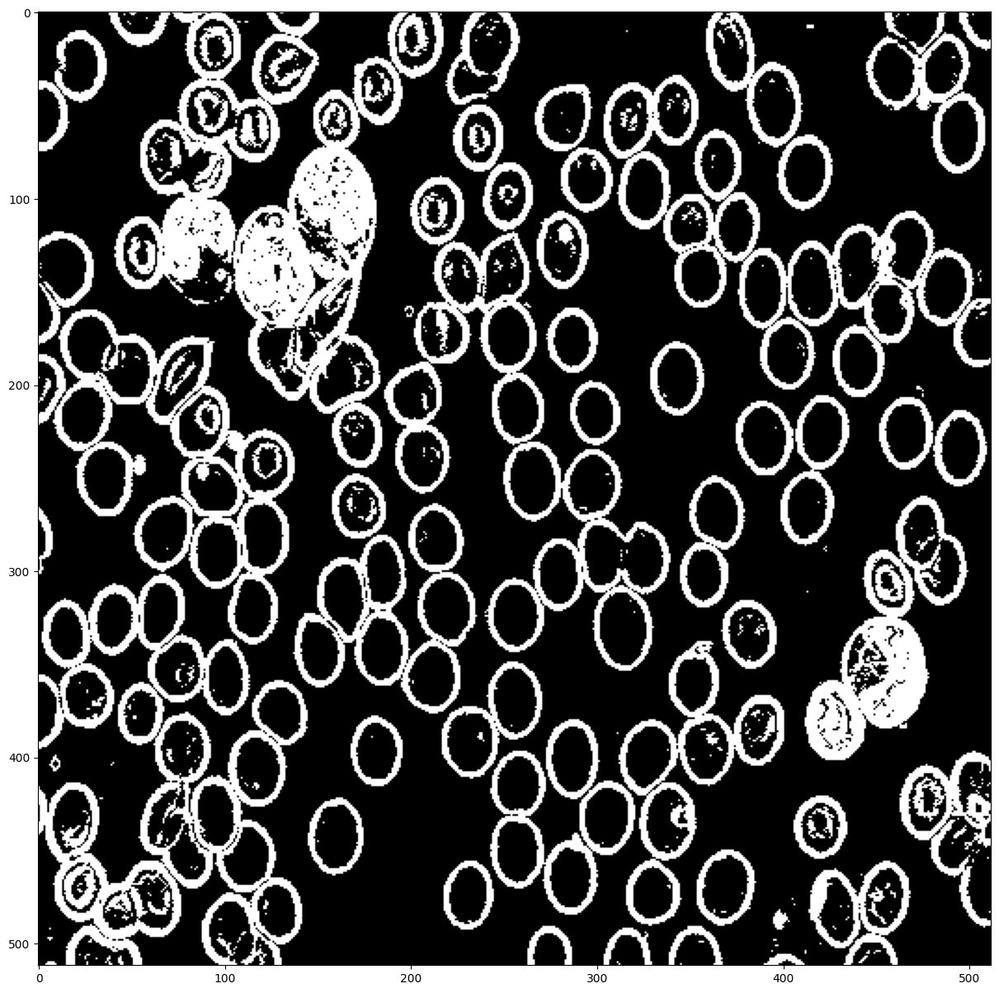

In [15]:
if student :
  thresh_grad = morpho_grad > 5
plt.figure(figsize=(15,15))
plt.imshow(thresh_grad,cmap  ="gray")
plt.show()

- **Q** Apply the watershed algorithm to the gradient image using morpho.watershed(morpho_grad,k) ;
What do you observe ? 
- **A** : In the cell below, we put the outlined regions on top of the gradient image. The watershed method works well for some cells, but for others, it combines them into one big region.
- **Q** Try to change the parameter k ; what is the role of that parameter ?
- **A** : The value of k decides how many distinct regions are identified.

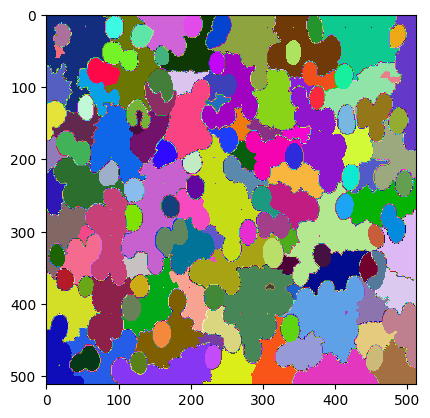

In [25]:
import matplotlib
cmaprand = matplotlib.colors.ListedColormap ( np.random.rand ( 256,3))
if student :
  wat = seg.watershed(morpho_grad,200)

plt.imshow(wat, cmap=cmaprand)
plt.show()

- **Q** : Apply first a closing on the gradient image and then the watershed. Is the result better ? In which sense and why ?
- **A** : By performing a closing operation on the gradient image, we effectively remove small dark areas, resulting in smoother and more continuous contours while reducing microstructures and noise. However, the application of the watershed algorithm did not yield better results. This could be because the internal structures were smoothed out during the process, causing the interiors of cells to become lighter and their contours less distinct.
- **Q** : Apply an opening with the same structuring element on the gradient image and then do a watershed. What is the difference between this operation and the previous? 
- **A** : Applying an opening operation leads to the elimination of small light regions, which, in turn, results in the deterioration of cell contours. Unfortunately, this negatively impacted the performance of the watershed algorithm, making the results worse.

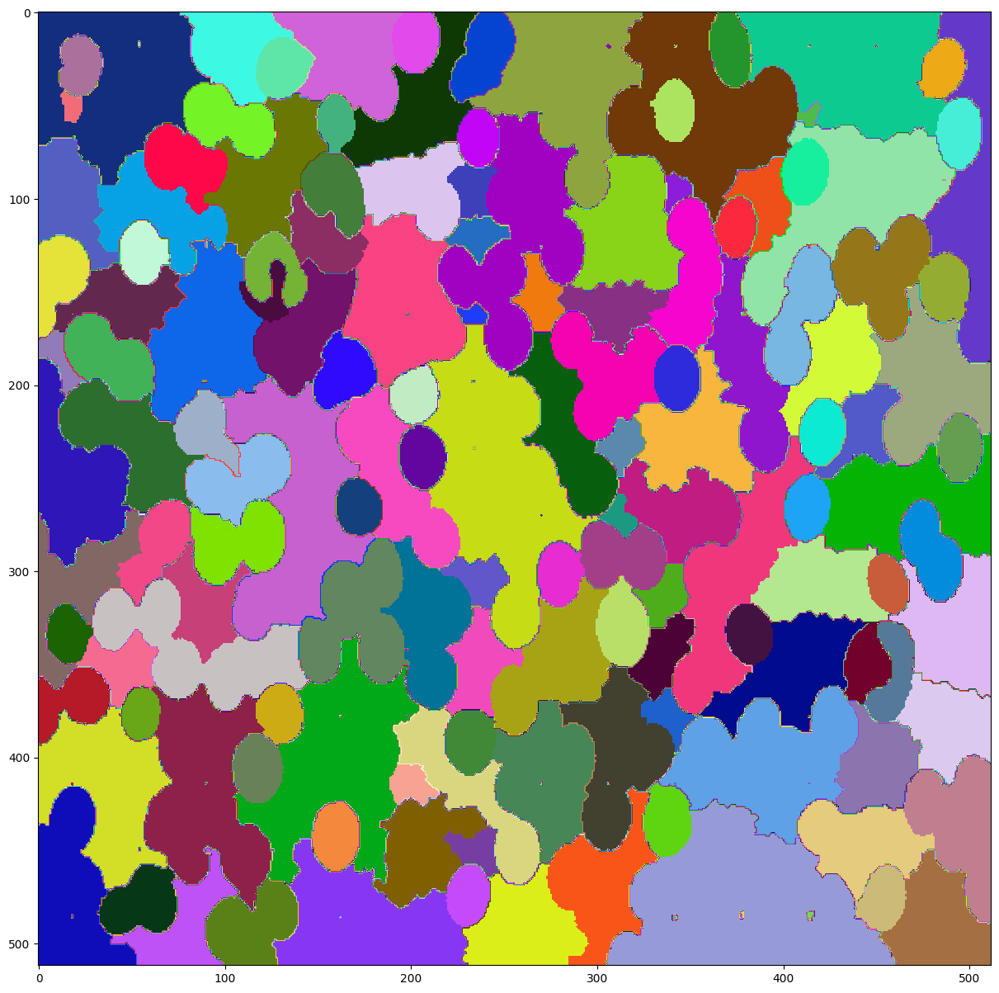

In [26]:
if student :
  wat_closing = seg.watershed(morpho.closing(morpho_grad, morpho.disk(1)), 200)
plt.figure(figsize =(15,15))
plt.imshow(wat_closing,cmap =cmaprand)
plt.show()

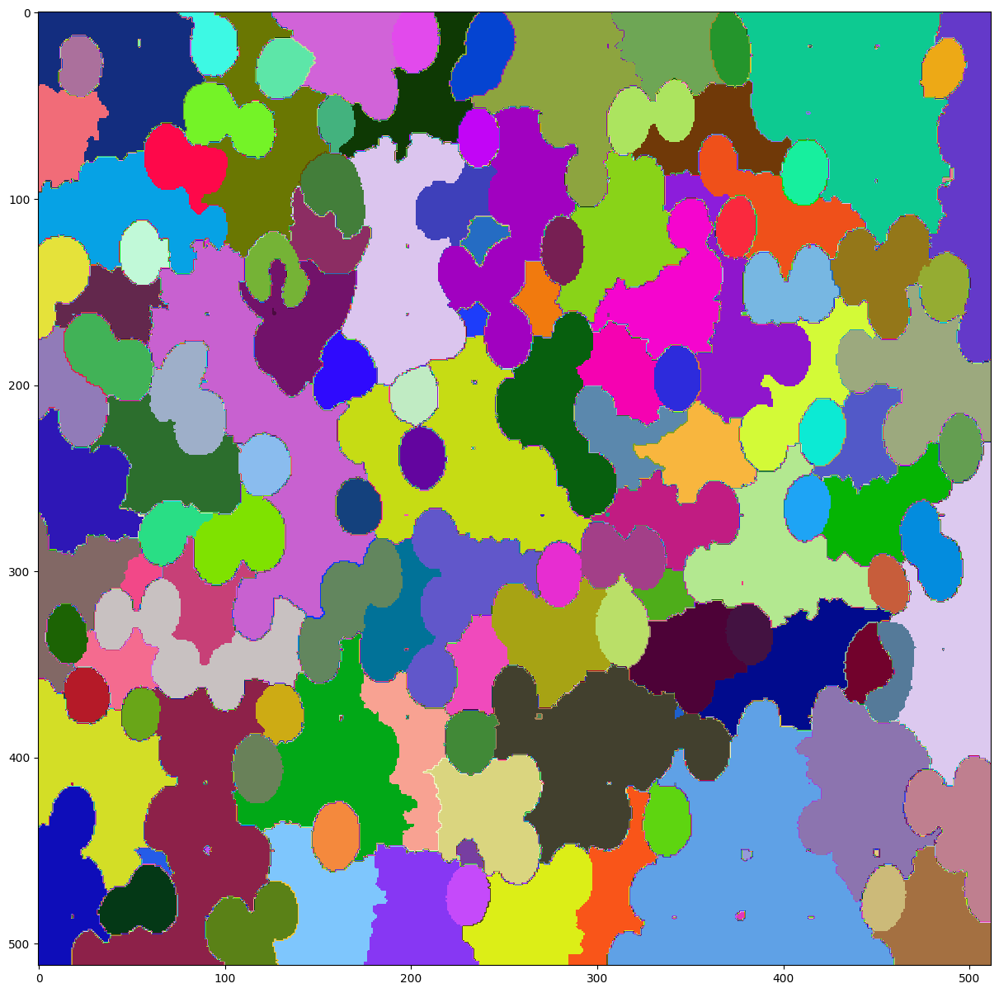

In [27]:
if student :
  wat_opening = seg.watershed(morpho.opening(morpho_grad, morpho.disk(1)), 200)
plt.figure(figsize =(15,15))
plt.imshow(wat_opening,cmap =cmaprand)
plt.show()

Your objective is to try to do better than what you did with the closure and opening. To do that, we propose to use specific markers for the watershed transform.

**Q** : In the next cell, compute the reconstruction from an opening of the gradient. You can use as structuring element a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : Upon calculating the reconstruction from the opening of the gradient, we notice that the resulting image contains more information, finer details, and additional noise compared to the original morphological gradient image. Consequently, this process does not enhance the segmentation of the cells.

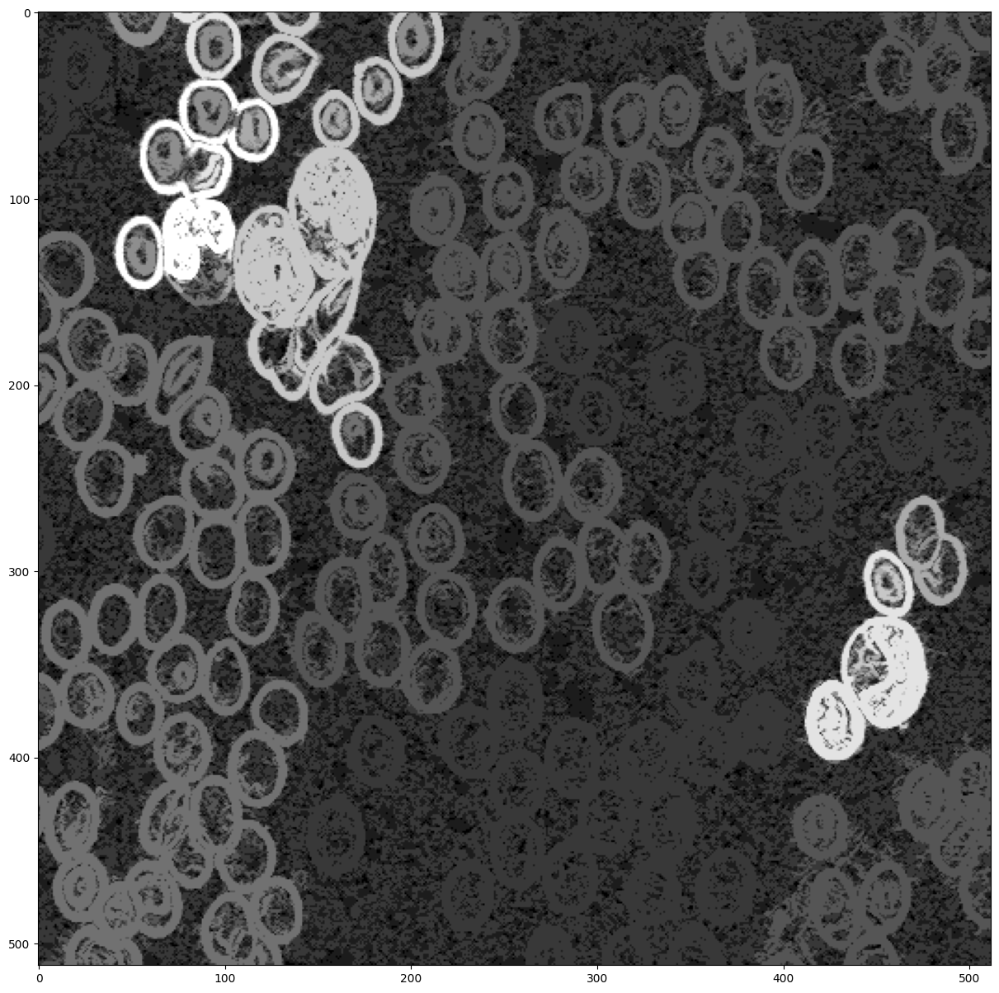

In [30]:
imOpen = morpho.opening(morpho_grad, morpho.disk(5))
reco = morpho.reconstruction( imOpen, morpho_grad )
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : In the next cell, compute the reconstruction from an closing of the gradient. You can use as structuring alement a disk of size 5. What do you observe ? Could it help you to efficiently segment the cells ?

**A** : When we reconstruct from the gradient's closing, we end up with an image that mostly retains the cell contours. This step is expected to be beneficial for effective cell segmentation.

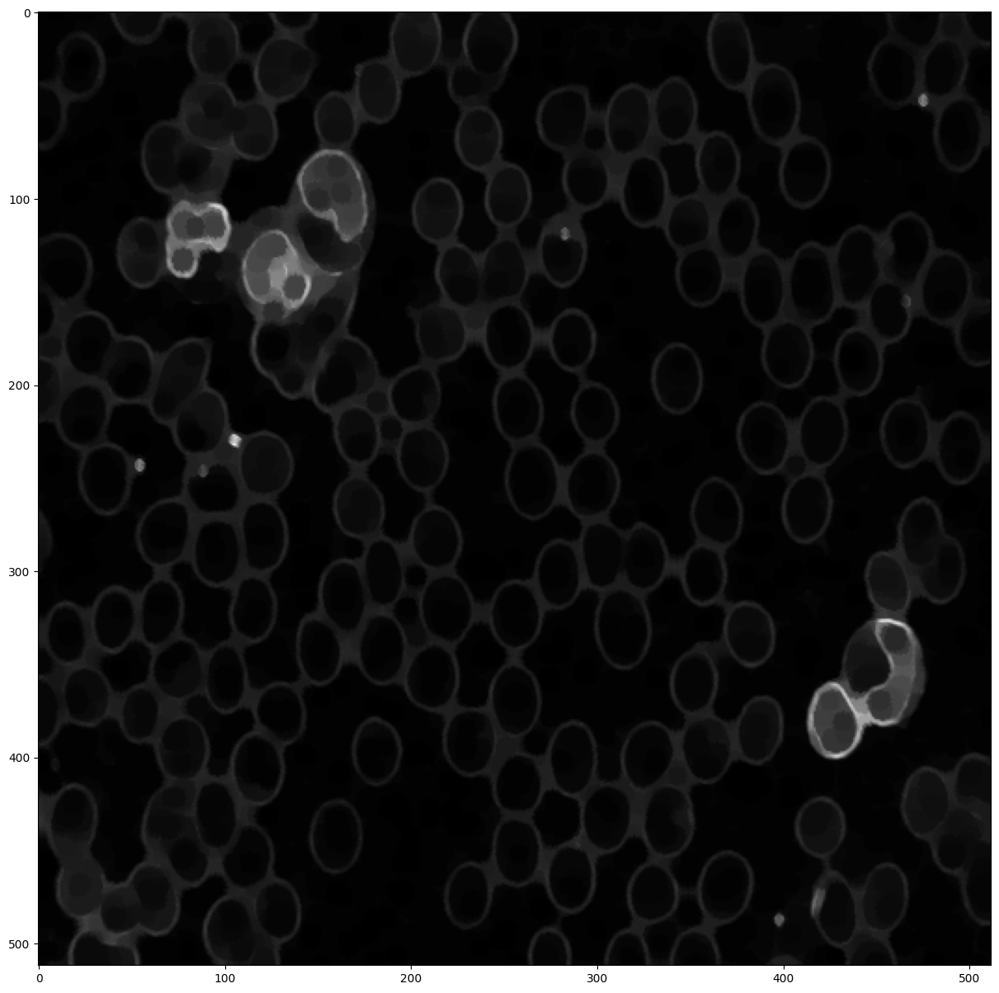

In [32]:
imClos = morpho.closing(morpho_grad, morpho.disk(5))
reco = morpho.reconstruction( morpho_grad, imClos )
plt.figure(figsize =(15,15))
plt.imshow(reco,cmap = "gray")
plt.show()

**Q** : This last part is less guided. Use the reconstruction operation and the above questions to find good markers for the watershed algorithm. You could benefit from using the peak_local_max function of skimage.feature

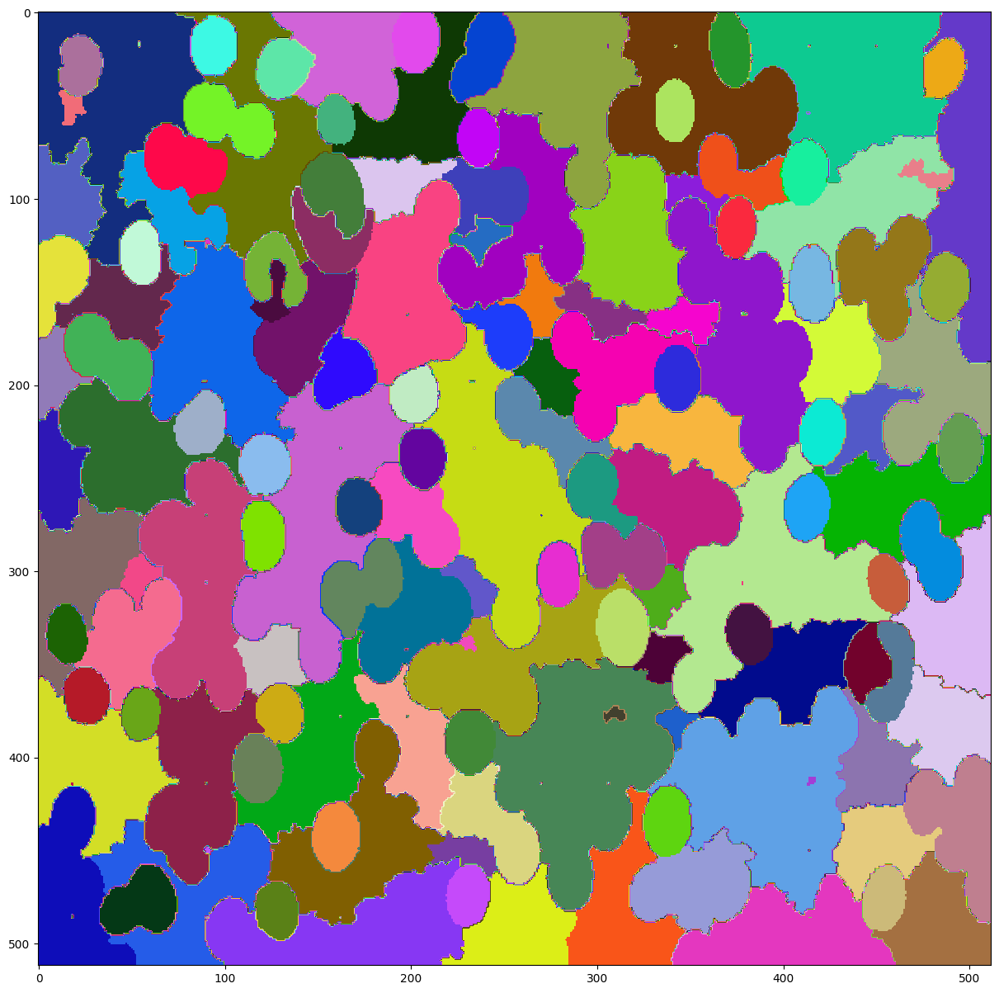

In [28]:
plt.figure(figsize =(15,15))
plt.imshow(wat,cmap =cmaprand)
plt.show()